In [18]:
#Importing Libraries
# Supress Warnings
# Supressing Warnings

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [19]:
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)
import pandas as pd
import numpy as np

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [20]:
#Importing Dataset
df=pd.read_csv("my_movies.csv")
df


,V1,V2,V3,V4,V5,Sixth Sense,Gladiator,LOTR1,Harry Potter1,Patriot,LOTR2,Harry Potter2,LOTR,Braveheart,Green Mile
0,Sixth Sense,LOTR1,Harry Potter1,Green Mile,LOTR2,1,0,1,1,0,1,0,0,0,1
1,Gladiator,Patriot,Braveheart,NaN,NaN,0,1,0,0,1,0,0,0,1,0
2,LOTR1,LOTR2,NaN,NaN,NaN,0,0,1,0,0,1,0,0,0,0
3,Gladiator,Patriot,Sixth Sense,NaN,NaN,1,1,0,0,1,0,0,0,0,0
4,Gladiator,Patriot,Sixth Sense,NaN,NaN,1,1,0,0,1,0,0,0,0,0
5,Gladiator,Patriot,Sixth Sense,NaN,NaN,1,1,0,0,1,0,0,0,0,0
6,Harry Potter1,Harry Potter2,NaN,NaN,NaN,0,0,0,1,0,0,1,0,0,0
7,Gladiator,Patriot,NaN,NaN,NaN,0,1,0,0,1,0,0,0,0,0
8,Gladiator,Patriot,Sixth Sense,NaN,NaN,1,1,0,0,1,0,0,0,0,0
9,Sixth Sense,LOTR,Gladiator,Green Mile,NaN,1,1,0,0,0,0,0,1,0,1


In [21]:
df.head()
df.tail()


,V1,V2,V3,V4,V5,Sixth Sense,Gladiator,LOTR1,Harry Potter1,Patriot,LOTR2,Harry Potter2,LOTR,Braveheart,Green Mile
5,Gladiator,Patriot,Sixth Sense,NaN,NaN,1,1,0,0,1,0,0,0,0,0
6,Harry Potter1,Harry Potter2,NaN,NaN,NaN,0,0,0,1,0,0,1,0,0,0
7,Gladiator,Patriot,NaN,NaN,NaN,0,1,0,0,1,0,0,0,0,0
8,Gladiator,Patriot,Sixth Sense,NaN,NaN,1,1,0,0,1,0,0,0,0,0
9,Sixth Sense,LOTR,Gladiator,Green Mile,NaN,1,1,0,0,0,0,0,1,0,1


In [22]:
#Data Exploration
#Descriptive Statistics
df.describe()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   V1             10 non-null     object
 1   V2             10 non-null     object
 2   V3             7 non-null      object
 3   V4             2 non-null      object
 4   V5             1 non-null      object
 5   Sixth Sense    10 non-null     int64 
 6   Gladiator      10 non-null     int64 
 7   LOTR1          10 non-null     int64 
 8   Harry Potter1  10 non-null     int64 
 9   Patriot        10 non-null     int64 
 10  LOTR2          10 non-null     int64 
 11  Harry Potter2  10 non-null     int64 
 12  LOTR           10 non-null     int64 
 13  Braveheart     10 non-null     int64 
 14  Green Mile     10 non-null     int64 
dtypes: int64(10), object(5)
memory usage: 1.3+ KB


In [23]:
#Missing Values
df.isnull().sum()

V1               0
V2               0
V3               3
V4               8
V5               9
Sixth Sense      0
Gladiator        0
LOTR1            0
Harry Potter1    0
Patriot          0
LOTR2            0
Harry Potter2    0
LOTR             0
Braveheart       0
Green Mile       0
dtype: int64

In [24]:
#Duplicated Values
df.duplicated().sum()

3

In [25]:
#columns
df.columns

Index(['V1', 'V2', 'V3', 'V4', 'V5', 'Sixth Sense', 'Gladiator', 'LOTR1',
       'Harry Potter1', 'Patriot', 'LOTR2', 'Harry Potter2', 'LOTR',
       'Braveheart', 'Green Mile'],
      dtype='object')

In [26]:
#Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns

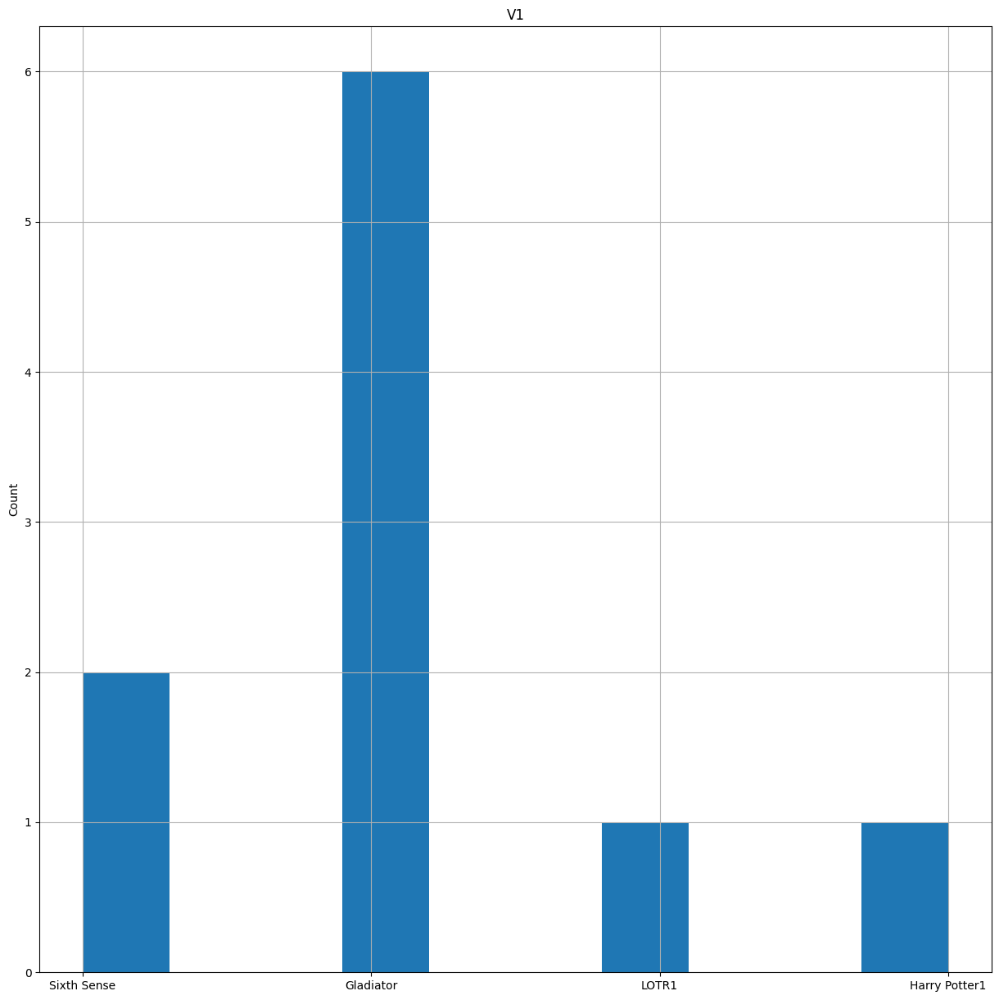

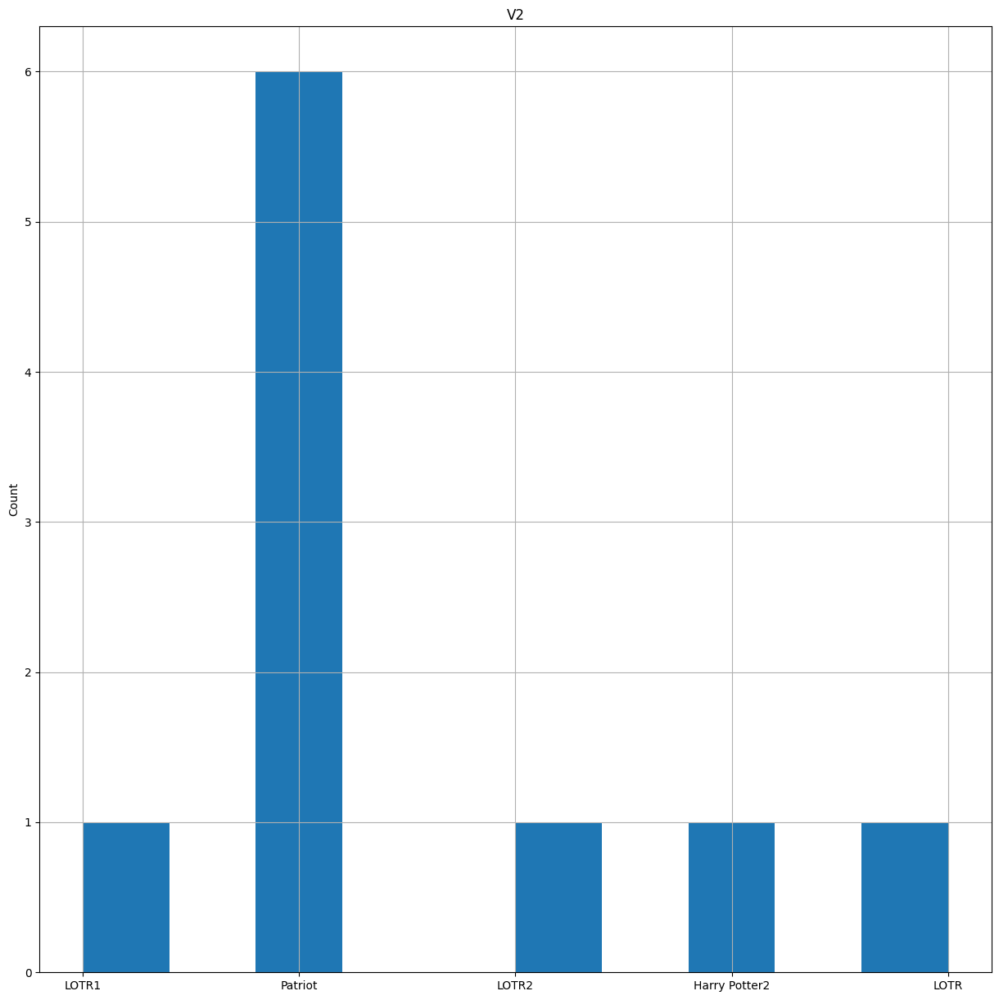

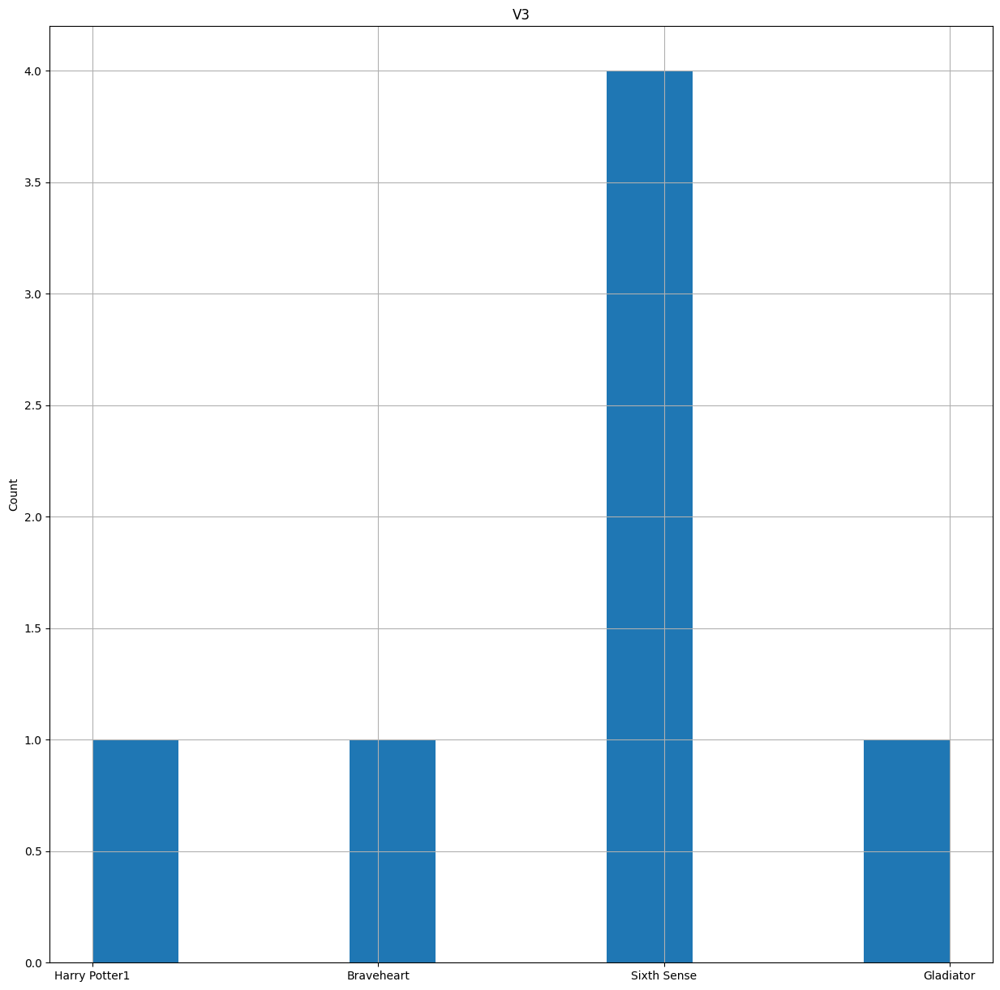

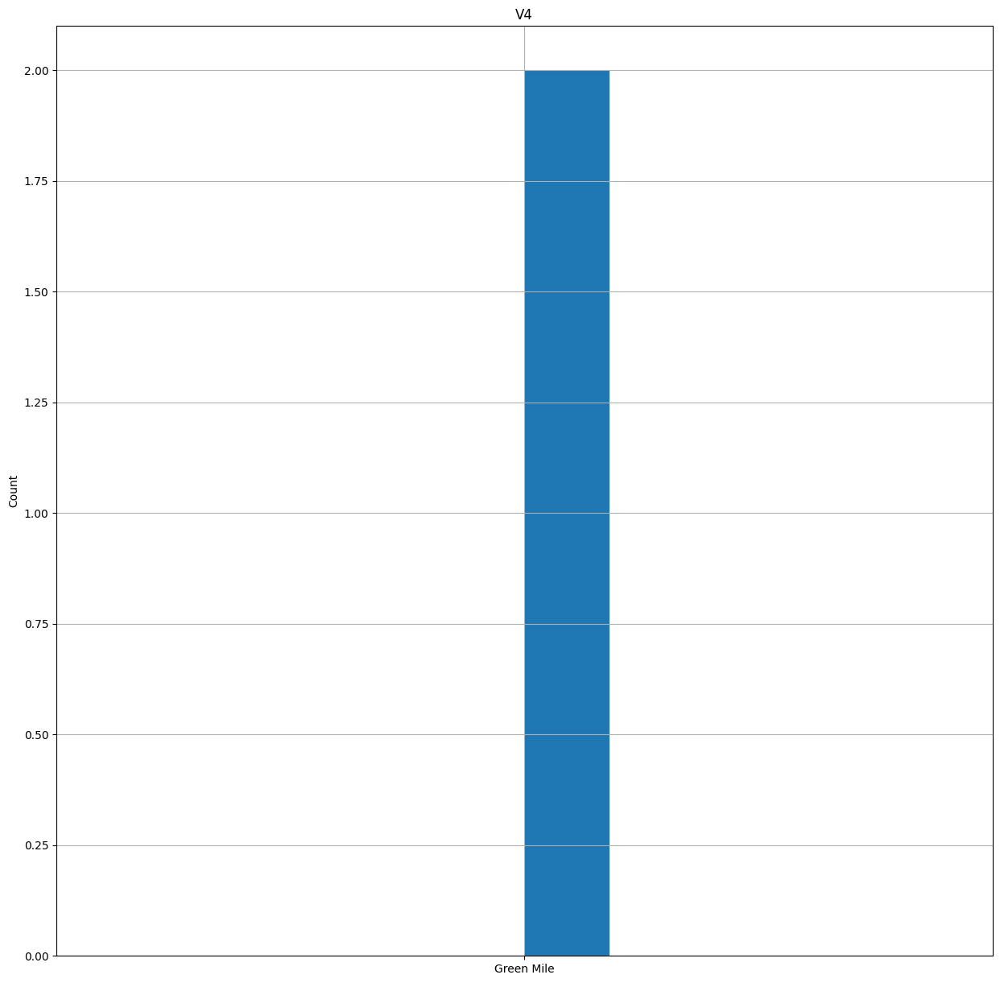

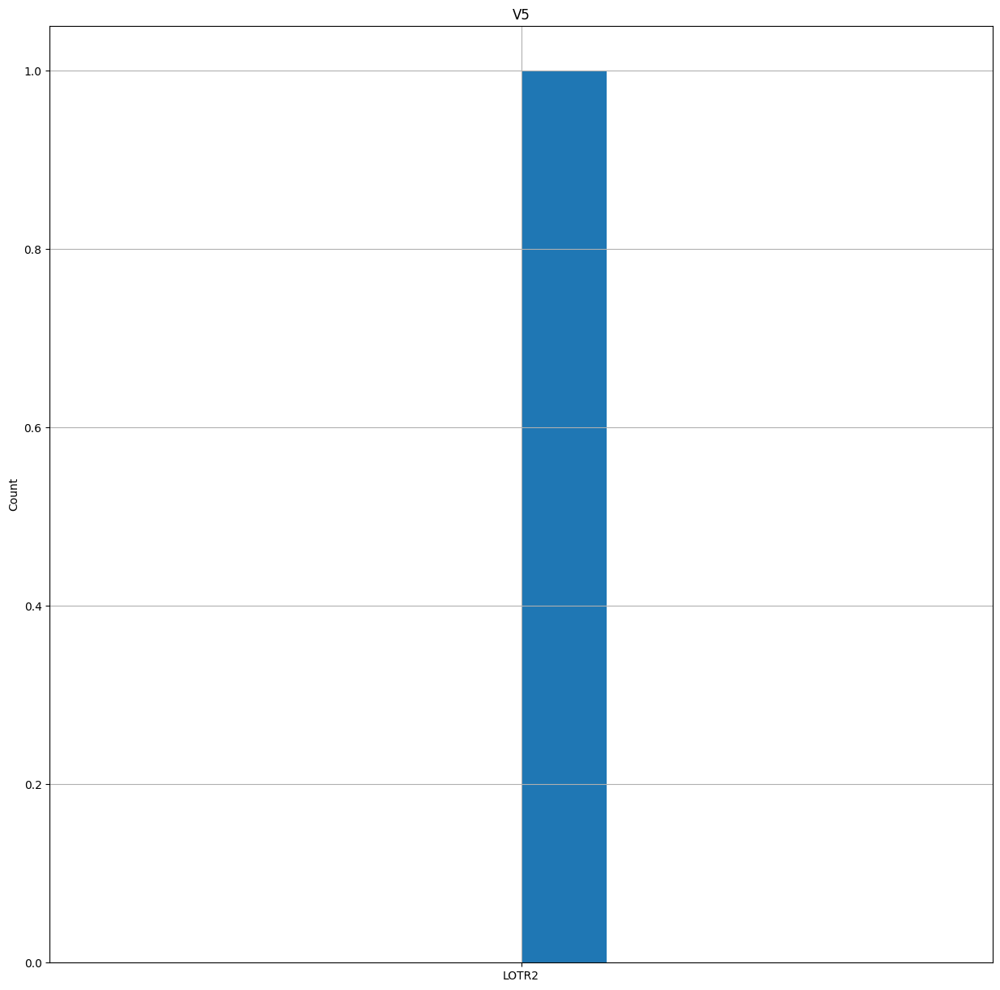

...

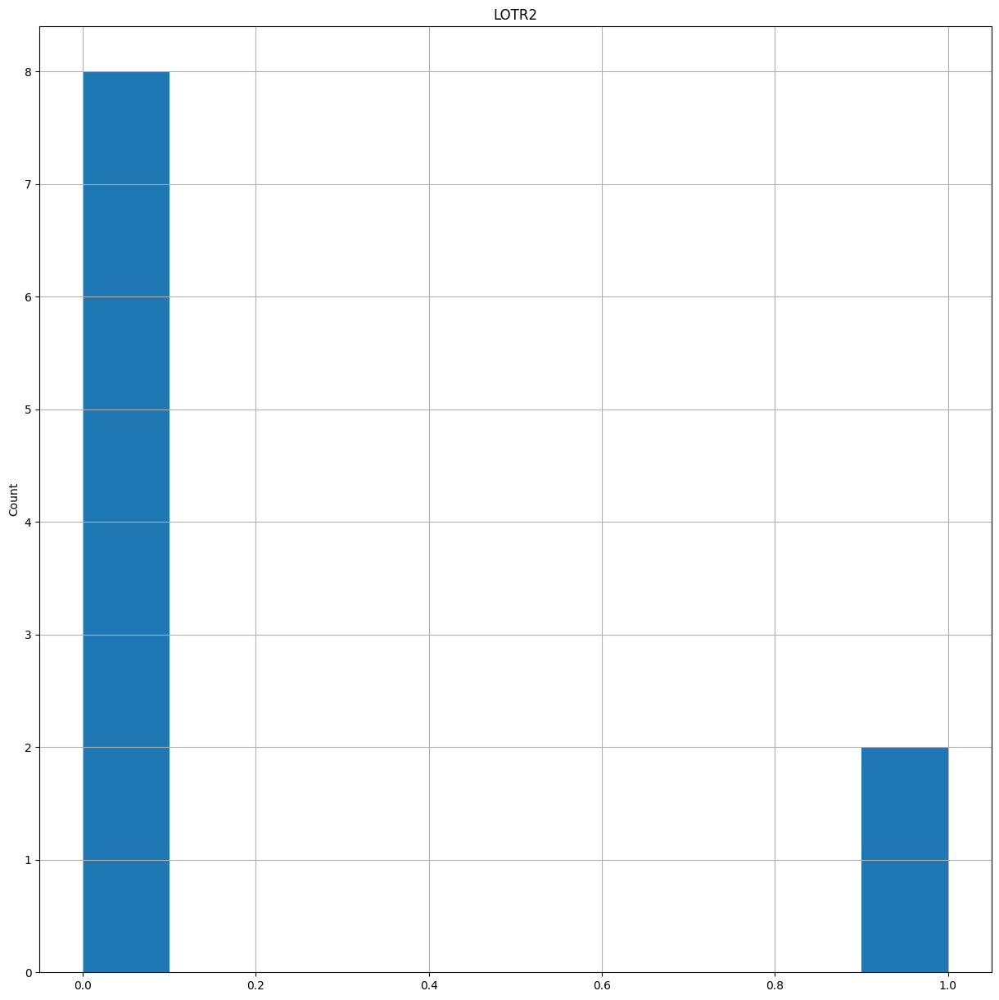

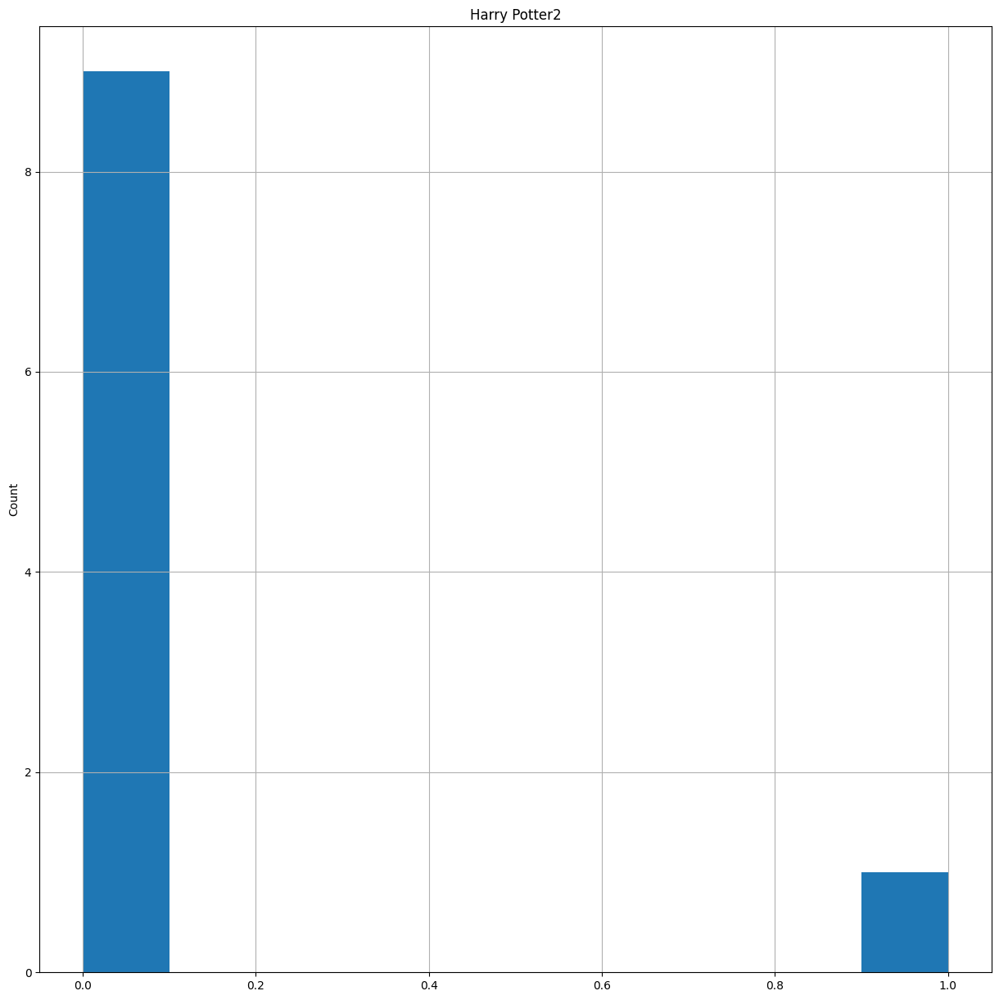

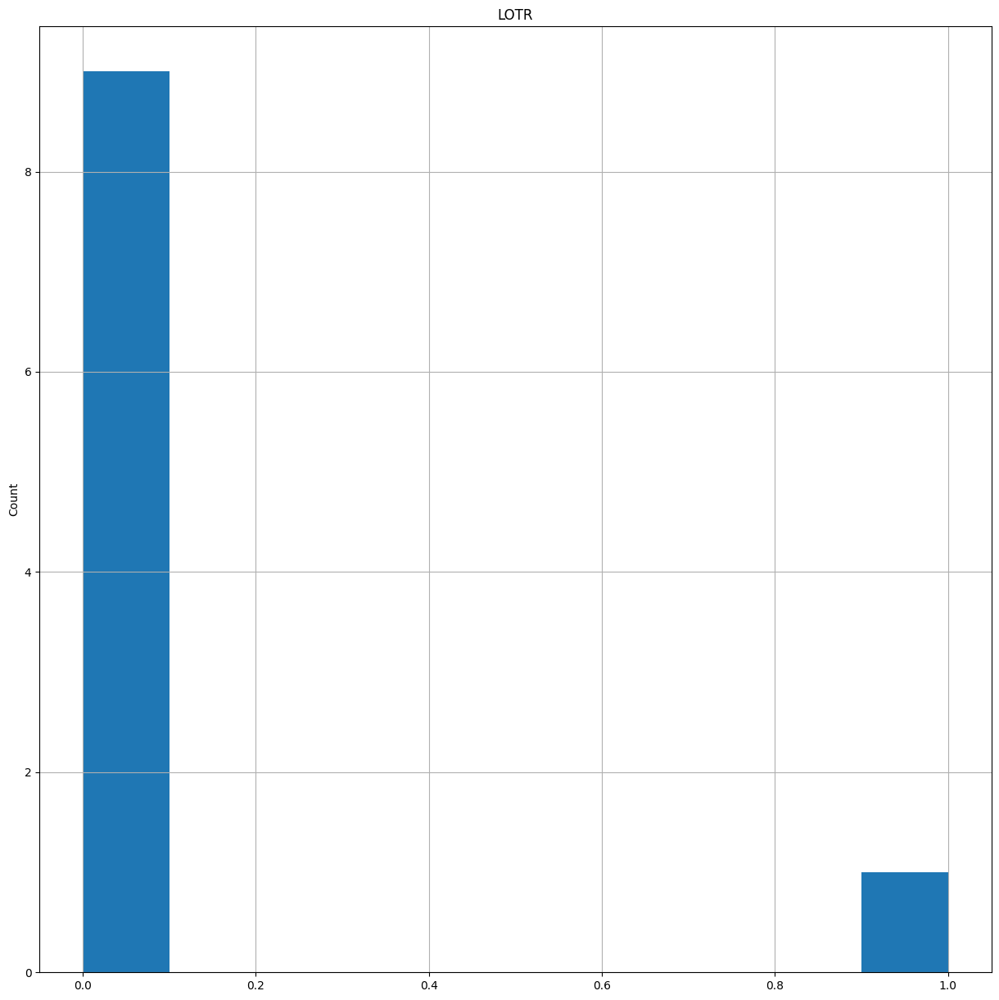

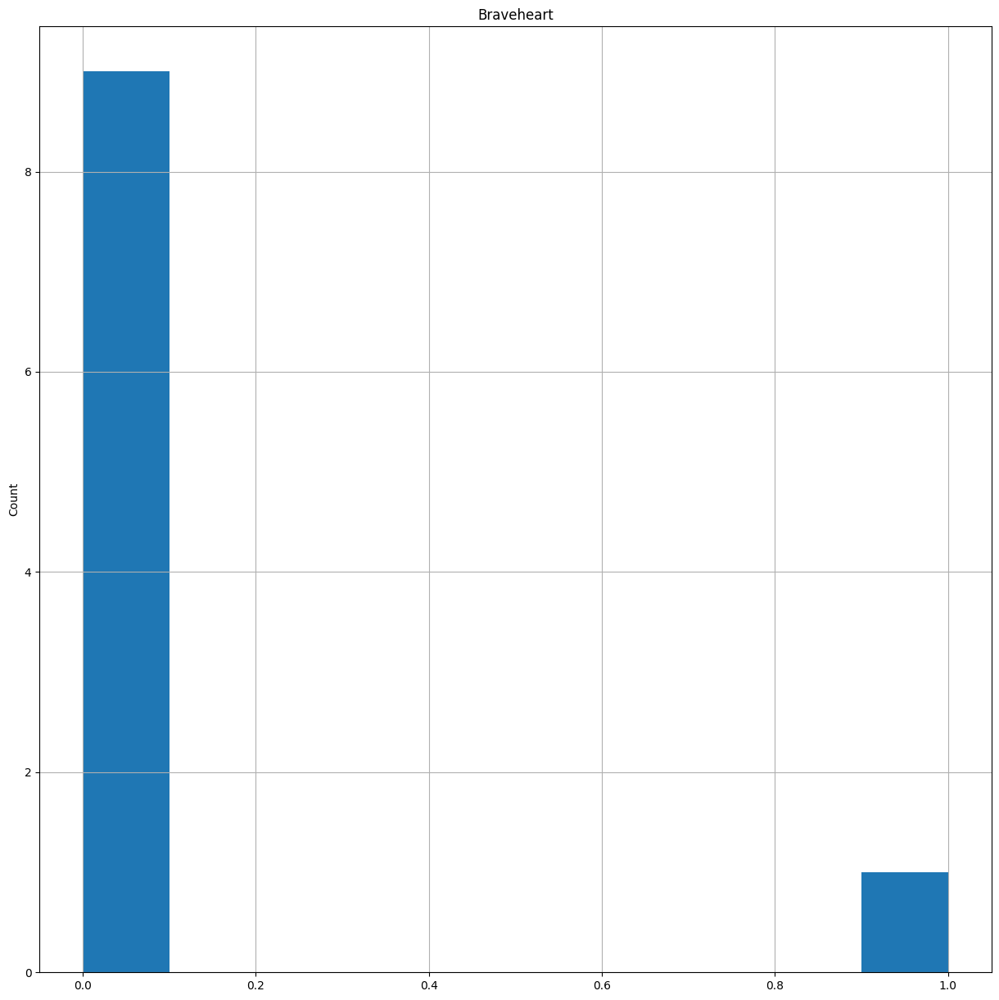

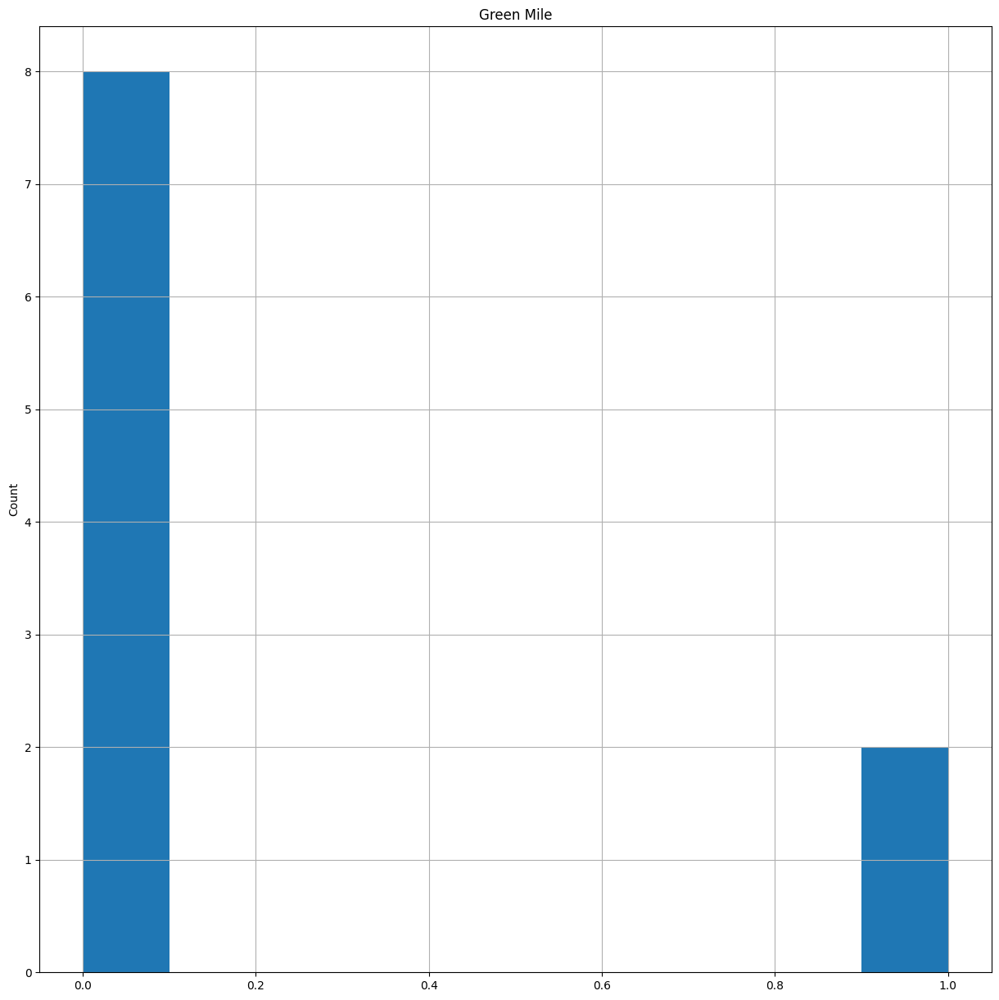

In [27]:
#plot histgraph
for i in df.columns:
    data=df.copy()
    data[i].hist(bins=10)
    plt.ylabel('Count')
    plt.title(i)
    plt.show()

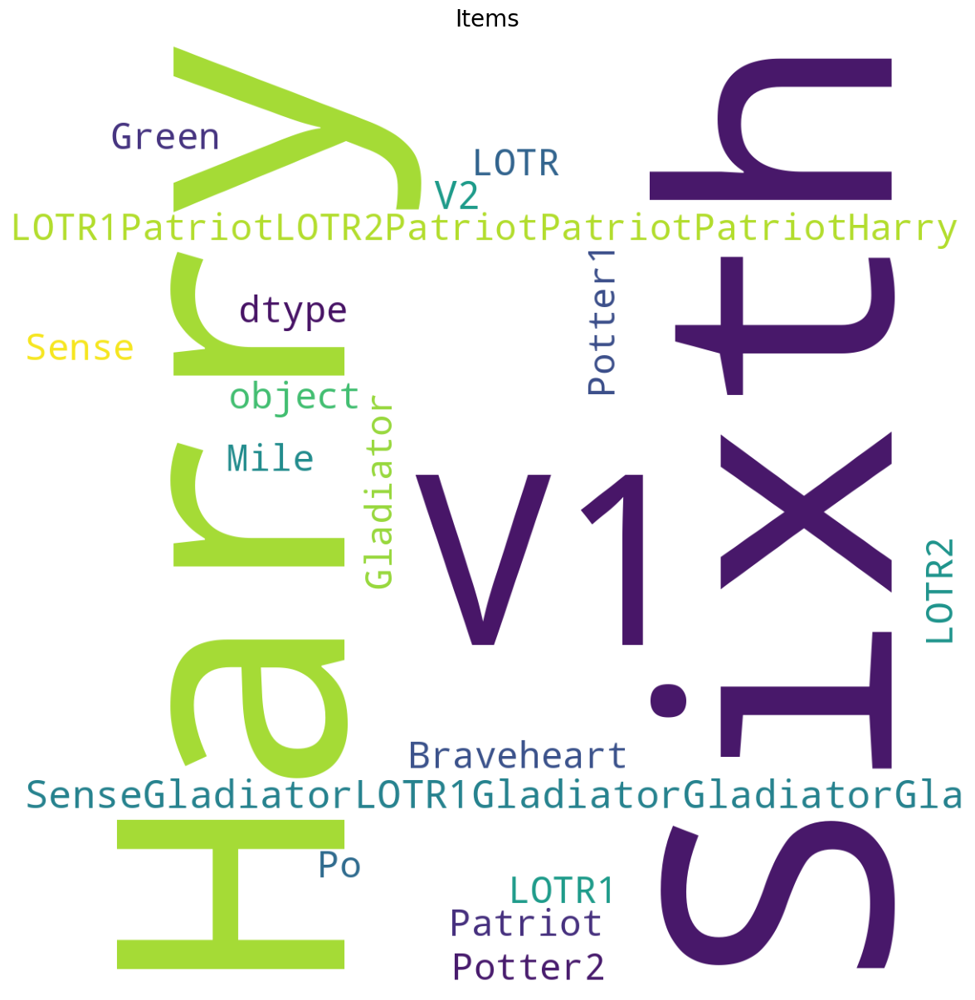

In [28]:
#Data Visualization
from wordcloud import WordCloud

plt.rcParams['figure.figsize'] = (15, 15)
wordcloud = WordCloud(background_color = 'white', width = 1200,  height = 1200, max_words = 121).generate(str(data.sum()))
plt.imshow(wordcloud)
plt.axis('off')
plt.title('Items',fontsize = 20)
plt.show()

In [30]:
df = df.astype(bool)

In [31]:
#Association rules with 15% Support and 40% confidence
from mlxtend.frequent_patterns import apriori,association_rules
frequent_itemsets = apriori(df, min_support=0.2, use_colnames=True)
frequent_itemsets['length'] = frequent_itemsets['itemsets'].apply(lambda x: len(x))
frequent_itemsets
frequent_itemsets.shape

(447, 3)

In [32]:
#with 40% Confidence
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=0.7)
rules
rules.shape
list(rules)

['antecedents',
 'consequents',
 'antecedent support',
 'consequent support',
 'support',
 'confidence',
 'lift',
 'leverage',
 'conviction',
 'zhangs_metric']

In [33]:
#shorting the rules in ascending
rules.sort_values('lift',ascending = False)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
6806,"(V4, V2, LOTR1, V5)","(LOTR2, V1)",0.2,0.2,0.2,1.0,5.0,0.16,inf,1.0
6820,"(V4, LOTR2, V5, V1)","(V2, LOTR1)",0.2,0.2,0.2,1.0,5.0,0.16,inf,1.0
3487,"(V2, LOTR1, V4, V1)",(LOTR2),0.2,0.2,0.2,1.0,5.0,0.16,inf,1.0
6801,"(V2, LOTR1, V5, V4, V1)",(LOTR2),0.2,0.2,0.2,1.0,5.0,0.16,inf,1.0
6804,"(V2, V5, V4, LOTR2, V1)",(LOTR1),0.2,0.2,0.2,1.0,5.0,0.16,inf,1.0
...,...,...,...,...,...,...,...,...,...,...
3297,"(Patriot, V1)","(V4, V2, V5)",0.6,1.0,0.6,1.0,1.0,0.00,inf,0.0
3296,"(V4, Patriot)","(V2, V5, V1)",0.6,1.0,0.6,1.0,1.0,0.00,inf,0.0
3295,"(V5, Patriot)","(V2, V4, V1)",0.6,1.0,0.6,1.0,1.0,0.00,inf,0.0
3294,"(V2, V1)","(V4, V5, Patriot)",1.0,0.6,0.6,0.6,1.0,0.00,1.0,0.0


In [34]:
#shorting the rules in ascending with 10
rules.sort_values('lift',ascending = False)[0:10]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
6806,"(V4, V2, LOTR1, V5)","(LOTR2, V1)",0.2,0.2,0.2,1.0,5.0,0.16,inf,1.0
6820,"(V4, LOTR2, V5, V1)","(V2, LOTR1)",0.2,0.2,0.2,1.0,5.0,0.16,inf,1.0
3487,"(V2, LOTR1, V4, V1)",(LOTR2),0.2,0.2,0.2,1.0,5.0,0.16,inf,1.0
6801,"(V2, LOTR1, V5, V4, V1)",(LOTR2),0.2,0.2,0.2,1.0,5.0,0.16,inf,1.0
6804,"(V2, V5, V4, LOTR2, V1)",(LOTR1),0.2,0.2,0.2,1.0,5.0,0.16,inf,1.0
6808,"(V2, LOTR1, V5, V1)","(V4, LOTR2)",0.2,0.2,0.2,1.0,5.0,0.16,inf,1.0
6810,"(V2, LOTR1, V4, V1)","(LOTR2, V5)",0.2,0.2,0.2,1.0,5.0,0.16,inf,1.0
6812,"(V4, V2, LOTR2, V5)","(LOTR1, V1)",0.2,0.2,0.2,1.0,5.0,0.16,inf,1.0
6814,"(V2, LOTR2, V5, V1)","(V4, LOTR1)",0.2,0.2,0.2,1.0,5.0,0.16,inf,1.0
6815,"(V2, LOTR2, V4, V1)","(LOTR1, V5)",0.2,0.2,0.2,1.0,5.0,0.16,inf,1.0


In [35]:
# Lift Ratio > 1 is a good influential rule in selecting the associated transactions
lift=rules[rules.lift>1]
lift

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
90,(Gladiator),(Sixth Sense),0.7,0.6,0.5,0.714286,1.190476,0.08,1.4,0.533333
91,(Sixth Sense),(Gladiator),0.6,0.7,0.5,0.833333,1.190476,0.08,1.8,0.400000
92,(Patriot),(Sixth Sense),0.6,0.6,0.4,0.666667,1.111111,0.04,1.2,0.250000
93,(Sixth Sense),(Patriot),0.6,0.6,0.4,0.666667,1.111111,0.04,1.2,0.250000
94,(Sixth Sense),(Green Mile),0.6,0.2,0.2,0.333333,1.666667,0.08,1.2,1.000000
...,...,...,...,...,...,...,...,...,...,...
9544,"(V4, Gladiator)","(V2, Patriot, V5, V3, Sixth Sense, V1)",0.7,0.4,0.4,0.571429,1.428571,0.12,1.4,1.000000
9545,"(Gladiator, V1)","(V2, Patriot, V5, V3, Sixth Sense, V4)",0.7,0.4,0.4,0.571429,1.428571,0.12,1.4,1.000000
9548,(Patriot),"(V2, V5, V3, Sixth Sense, V4, V1, Gladiator)",0.6,0.5,0.4,0.666667,1.333333,0.10,1.5,0.625000
9550,(Sixth Sense),"(V2, V5, Patriot, V3, V4, V1, Gladiator)",0.6,0.6,0.4,0.666667,1.111111,0.04,1.2,0.250000


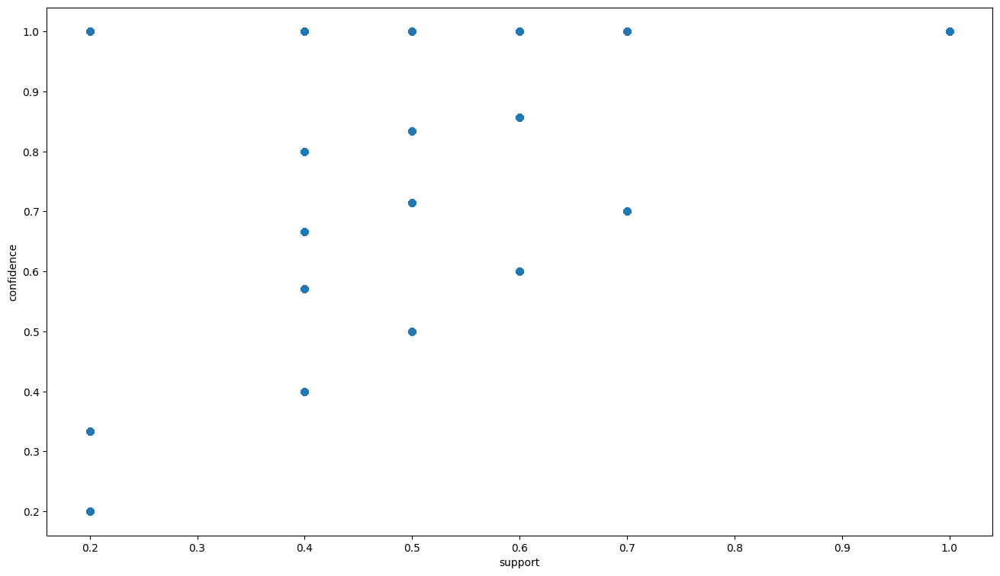

In [36]:
# visualization of obtained rule
plt.figure(figsize=(16,9))
plt.scatter(rules['support'],rules['confidence'])
plt.xlabel('support')
plt.ylabel('confidence')
plt.show()

array([[<Axes: title={'center': 'support'}>,
        <Axes: title={'center': 'confidence'}>],
       [<Axes: title={'center': 'lift'}>, <Axes: >]], dtype=object)

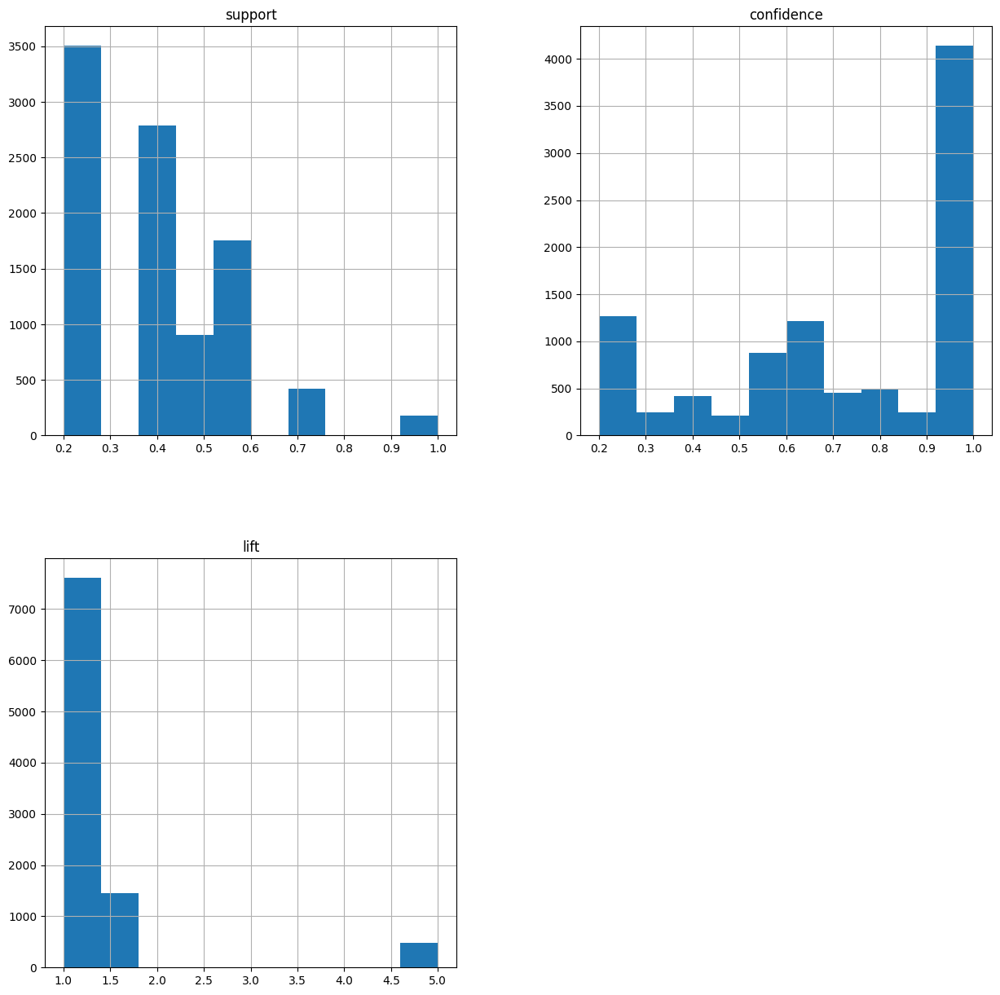

In [37]:
#Histogram for support , cinfidence and lift
rules[['support','confidence','lift']].hist()

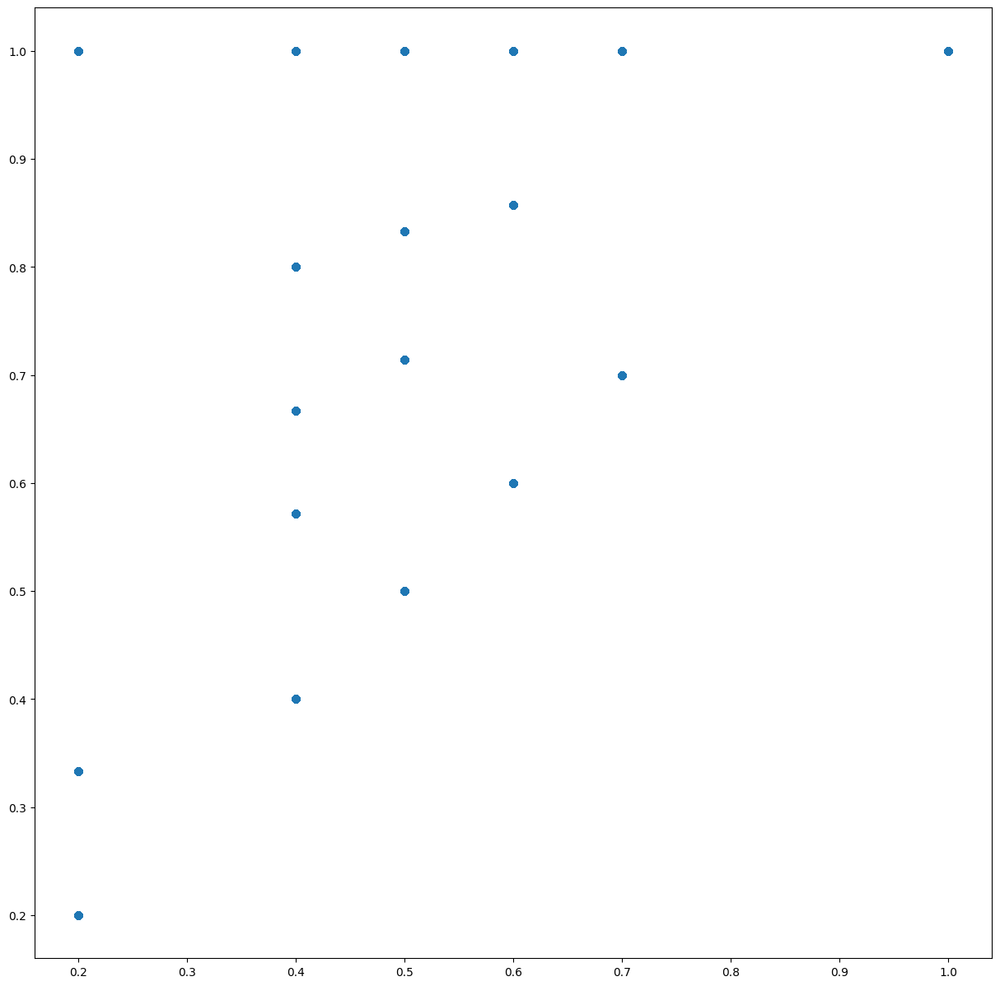

In [38]:
#Scatter plot between support and confidence
import matplotlib.pyplot as plt
plt.scatter(rules['support'], rules['confidence'])
plt.show()


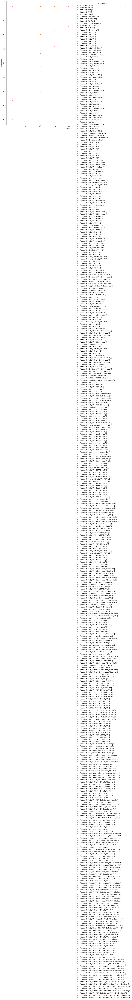

In [40]:
#scatter plot between support and confidence using seborn
import seaborn as sns
sns.scatterplot(x='support', y='confidence', data=rules, hue='antecedents')
plt.show()

In [41]:
#Association rules with 20% Support and 60% confidence
frequent_itemsets = apriori(df, min_support=0.1, use_colnames=True)
frequent_itemsets['length'] = frequent_itemsets['itemsets'].apply(lambda x: len(x))
frequent_itemsets
frequent_itemsets.shape


(1727, 3)

In [42]:
#with 50% Confidence
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=0.5)
rules
rules.shape
list(rules)

['antecedents',
 'consequents',
 'antecedent support',
 'consequent support',
 'support',
 'confidence',
 'lift',
 'leverage',
 'conviction',
 'zhangs_metric']

In [43]:
#shorting the rules in ascending
rules.sort_values('lift',ascending = False)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
75419,"(V2, V5, Green Mile, V3, V4, LOTR2)","(Harry Potter1, LOTR1)",0.1,0.1,0.1,1.000000,10.000000,0.09,inf,1.000000
32545,"(Gladiator, V4, V1, Green Mile)","(LOTR, Sixth Sense)",0.1,0.1,0.1,1.000000,10.000000,0.09,inf,1.000000
77259,"(V2, V5, V3, Sixth Sense, LOTR2, V1)","(Harry Potter1, V4, LOTR1)",0.1,0.1,0.1,1.000000,10.000000,0.09,inf,1.000000
50665,"(Harry Potter1, V2, Green Mile)","(V4, LOTR1, V1, Sixth Sense)",0.1,0.1,0.1,1.000000,10.000000,0.09,inf,1.000000
77257,"(V2, V5, V3, Sixth Sense, V4, LOTR2)","(Harry Potter1, LOTR1, V1)",0.1,0.1,0.1,1.000000,10.000000,0.09,inf,1.000000
...,...,...,...,...,...,...,...,...,...,...
29308,"(V3, V4, Sixth Sense, Green Mile)","(Gladiator, V1)",0.2,0.7,0.1,0.500000,0.714286,-0.04,0.600000,-0.333333
29309,"(V3, V1, Sixth Sense, Green Mile)","(V4, Gladiator)",0.2,0.7,0.1,0.500000,0.714286,-0.04,0.600000,-0.333333
29314,"(V4, V1, Sixth Sense, Green Mile)","(V3, Gladiator)",0.2,0.7,0.1,0.500000,0.714286,-0.04,0.600000,-0.333333
29321,"(V3, V4, V1, Gladiator)","(Sixth Sense, Green Mile)",0.7,0.2,0.1,0.142857,0.714286,-0.04,0.933333,-0.571429


In [44]:
#shorting the rules in ascending with 20
rules.sort_values('lift',ascending = False)[0:20]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
75419,"(V2, V5, Green Mile, V3, V4, LOTR2)","(Harry Potter1, LOTR1)",0.1,0.1,0.1,1.0,10.0,0.09,inf,1.0
32545,"(Gladiator, V4, V1, Green Mile)","(LOTR, Sixth Sense)",0.1,0.1,0.1,1.0,10.0,0.09,inf,1.0
77259,"(V2, V5, V3, Sixth Sense, LOTR2, V1)","(Harry Potter1, V4, LOTR1)",0.1,0.1,0.1,1.0,10.0,0.09,inf,1.0
50665,"(Harry Potter1, V2, Green Mile)","(V4, LOTR1, V1, Sixth Sense)",0.1,0.1,0.1,1.0,10.0,0.09,inf,1.0
77257,"(V2, V5, V3, Sixth Sense, V4, LOTR2)","(Harry Potter1, LOTR1, V1)",0.1,0.1,0.1,1.0,10.0,0.09,inf,1.0
32543,"(Gladiator, V4, Sixth Sense, Green Mile)","(LOTR, V1)",0.1,0.1,0.1,1.0,10.0,0.09,inf,1.0
32544,"(Gladiator, V1, Sixth Sense, Green Mile)","(LOTR, V4)",0.1,0.1,0.1,1.0,10.0,0.09,inf,1.0
50660,"(V2, LOTR1, Sixth Sense)","(Harry Potter1, V4, V1, Green Mile)",0.1,0.1,0.1,1.0,10.0,0.09,inf,1.0
50659,"(V2, LOTR1, Green Mile)","(Harry Potter1, V4, V1, Sixth Sense)",0.1,0.1,0.1,1.0,10.0,0.09,inf,1.0
50658,"(Harry Potter1, V4, V1, Sixth Sense)","(V2, LOTR1, Green Mile)",0.1,0.1,0.1,1.0,10.0,0.09,inf,1.0


In [45]:
# Lift Ratio <2 is a good influential rule in selecting the associated transactions
lift= rules[rules.lift<2]
lift

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(V2),(V1),1.0,1.0,1.0,1.000000,1.000000,0.00,inf,0.0
1,(V1),(V2),1.0,1.0,1.0,1.000000,1.000000,0.00,inf,0.0
2,(V3),(V1),1.0,1.0,1.0,1.000000,1.000000,0.00,inf,0.0
3,(V1),(V3),1.0,1.0,1.0,1.000000,1.000000,0.00,inf,0.0
4,(V4),(V1),1.0,1.0,1.0,1.000000,1.000000,0.00,inf,0.0
...,...,...,...,...,...,...,...,...,...,...
83288,(V5),"(V2, LOTR1, Green Mile, V3, Sixth Sense, Harry...",1.0,0.1,0.1,0.100000,1.000000,0.00,1.00,0.0
83290,(V3),"(V2, LOTR1, V5, Green Mile, Sixth Sense, Harry...",1.0,0.1,0.1,0.100000,1.000000,0.00,1.00,0.0
83291,(Sixth Sense),"(V2, LOTR1, V5, Green Mile, V3, Harry Potter1,...",0.6,0.1,0.1,0.166667,1.666667,0.04,1.08,1.0
83293,(V4),"(V2, LOTR1, V5, Green Mile, V3, Sixth Sense, H...",1.0,0.1,0.1,0.100000,1.000000,0.00,1.00,0.0


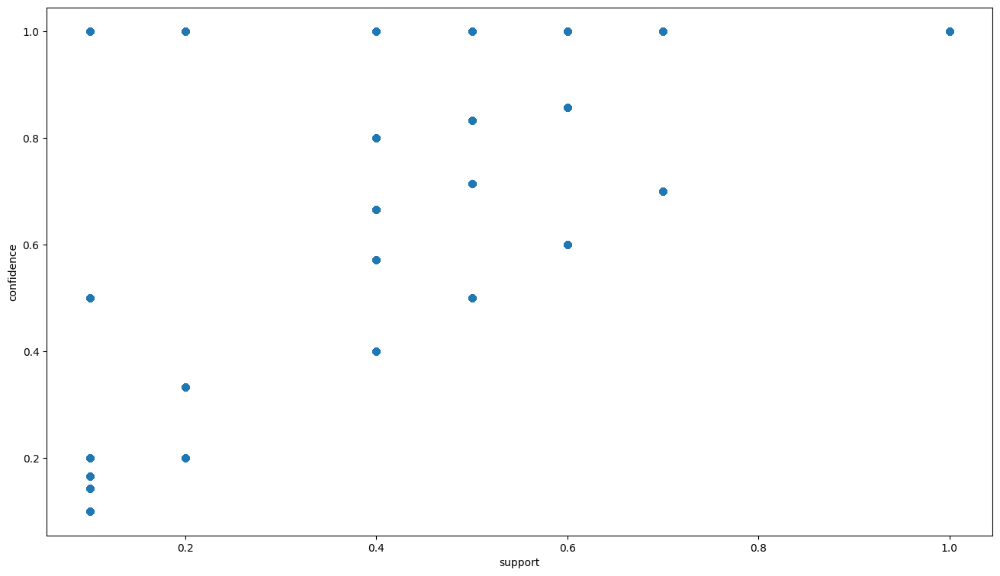

In [46]:
# visualization of obtained rule
plt.figure(figsize=(16,9))
plt.scatter(rules['support'],rules['confidence'])
plt.xlabel('support')
plt.ylabel('confidence')
plt.show()

array([[<Axes: title={'center': 'support'}>,
        <Axes: title={'center': 'confidence'}>],
       [<Axes: title={'center': 'lift'}>, <Axes: >]], dtype=object)

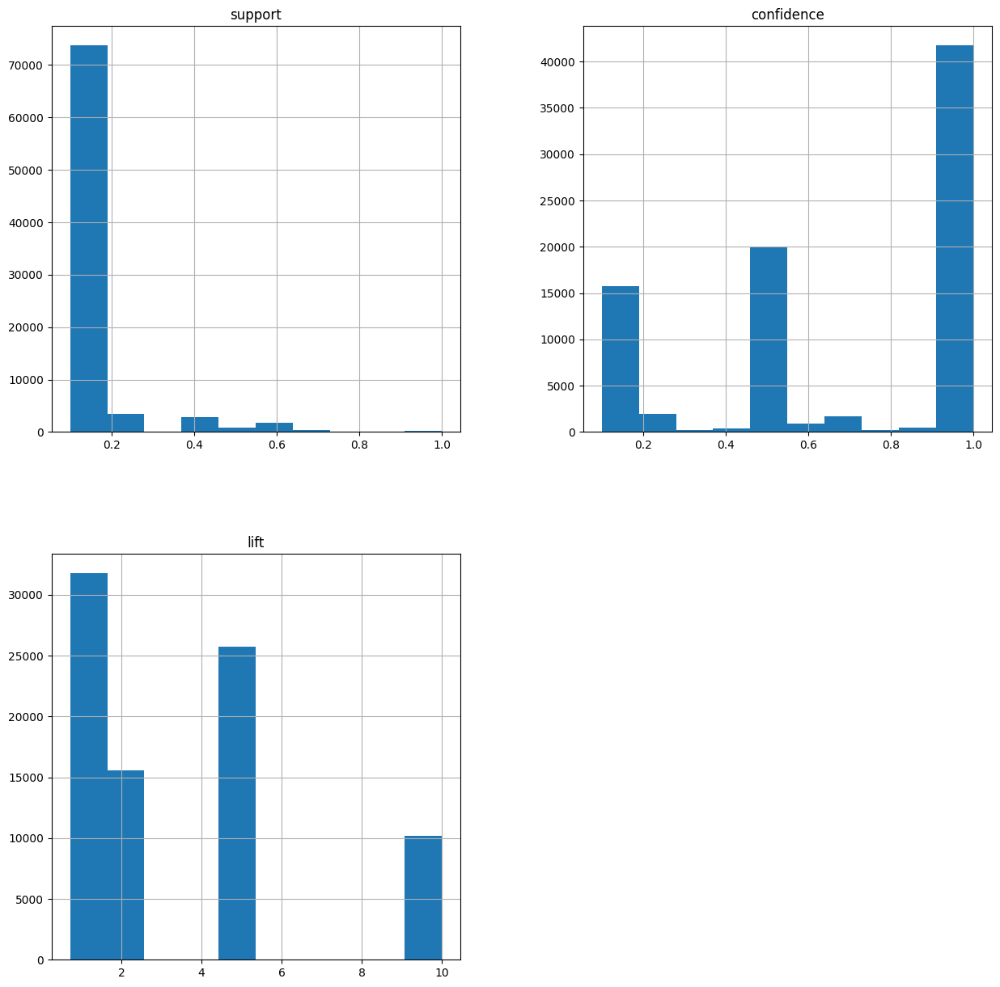

In [47]:
#Histogram for support , cinfidence and lift
rules[['support','confidence','lift']].hist()

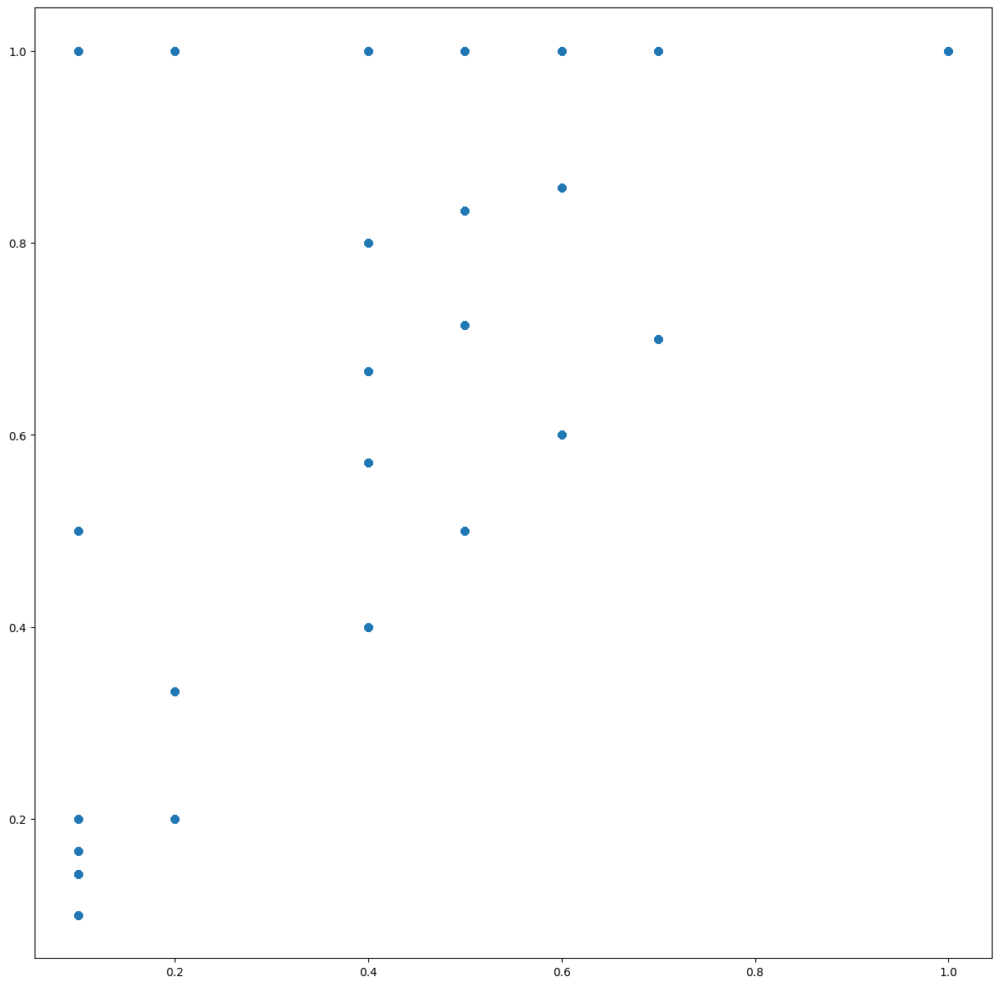

In [48]:
#Scatter plot between support and confidence
import matplotlib.pyplot as plt
plt.scatter(rules['support'], rules['confidence'])
plt.show()

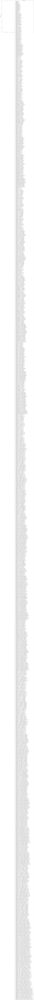

In [50]:
#scatter plot between support and confidence using seborn
import seaborn as sns
sns.scatterplot(x='support', y='confidence', data=rules, hue='antecedents')
plt.show()